In [1]:
import pandas as pd
file_path = 'IHME_DAH_DATABASE_1990_2020_Y2021M09D22.CSV'
chunksize = 100000
df_csv = pd.concat(pd.read_csv(file_path, chunksize=chunksize, encoding="utf-8", low_memory=False))

In [2]:
cols_to_convert = df_csv.columns[14:]
df_csv[cols_to_convert] = df_csv[cols_to_convert].apply(pd.to_numeric, errors='coerce')

In [3]:
df = df_csv.dropna()

In [4]:
num_rows_after_cleaning = df.shape[0]
num_rows_after_cleaning

134562

In [5]:
from sklearn.ensemble import IsolationForest
selected_columns = ['dah_20', 'hiv_dah_20']

isolation_forest = IsolationForest(contamination=0.05, random_state=42)
df['outliers'] = isolation_forest.fit_predict(df[selected_columns])
outliers_df = df[df['outliers'] == -1]
print(outliers_df)


        year         source  channel recipient_isocode  \
6       1990      Australia  BIL_AUS               CHN   
49      1990      Australia  BIL_AUS               PNG   
70      1990      Australia  BIL_AUS               VNM   
177     1990        Austria  BIL_AUT               UGA   
307     1990        Belgium  BIL_BEL               KEN   
...      ...            ...      ...               ...   
383044  2018  United_States   UNICEF               WLD   
383069  2018  United_States   WB_IDA               COD   
383077  2018  United_States   WB_IDA               ETH   
383089  2018  United_States   WB_IDA               IND   
383141  2018  United_States   WB_IDA               YEM   

                       recipient_country  gbd_location_id wb_regioncode  \
6                                  China                6           EAP   
49                      Papua New Guinea               26           EAP   
70                               Vietnam               20           EAP   
177

<ipython-input-5-c1a6312b6d84>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['outliers'] = isolation_forest.fit_predict(df[selected_columns])


In [6]:
import plotly.express as px
fig = px.scatter(df, x='dah_20', y='hiv_dah_20', color=df['outliers'].astype(str),
                 title='Wartości odstające w danych',
                 labels={'outliers': 'Odstające (1: normalne, -1: odstające)'})

fig.show()


In [7]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaled_data = scaler.fit_transform(df[['dah_20', 'hiv_dah_20', 'tb_dah_20']])

pca = PCA(n_components=2)
principal_components = pca.fit_transform(scaled_data)

df['PC1'] = principal_components[:, 0]
df['PC2'] = principal_components[:, 1]

print(pca.explained_variance_ratio_)

[0.65814856 0.27804402]


<ipython-input-7-f1f358ebdc3a>:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-7-f1f358ebdc3a>:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [8]:
fig = px.scatter(df, x='PC1', y='PC2', color=df['dah_20'],
                 title='Wizualizacja głównych składowych',
                 labels={'dah_20': 'Finansowanie DAH'})
fig.show()

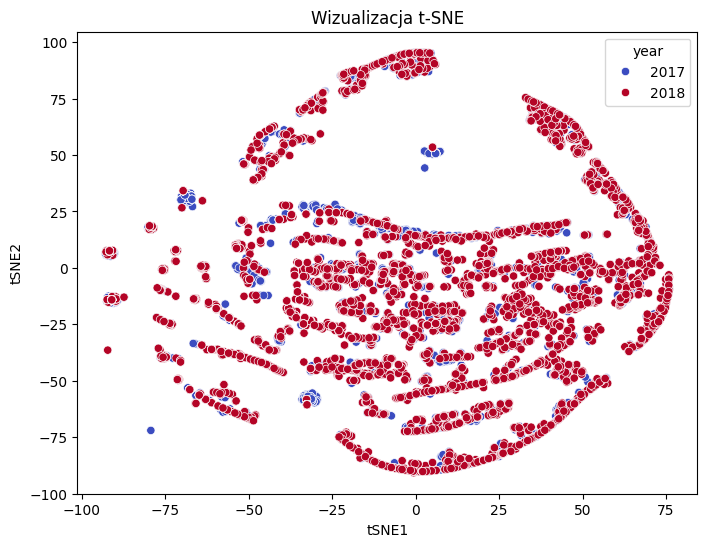

In [14]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns
df = df.tail(10000)
tsne = TSNE(n_components=2, random_state=42)
tsne_results = tsne.fit_transform(df[cols_to_convert])

df['tSNE1'] = tsne_results[:, 0]
df['tSNE2'] = tsne_results[:, 1]

plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x='tSNE1', y='tSNE2', hue=df['year'], palette='coolwarm')
plt.title('Wizualizacja t-SNE')
plt.show()


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



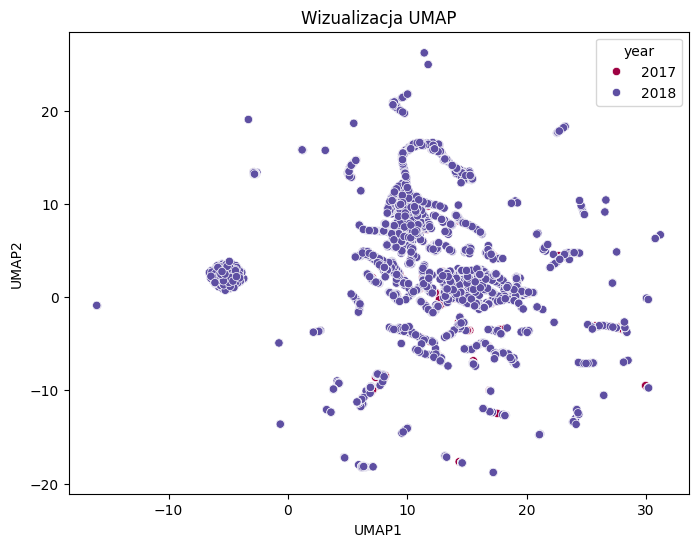

In [15]:
!pip install umap-learn
import umap.umap_ as umap
import matplotlib.pyplot as plt
import seaborn as sns

reducer = umap.UMAP(n_neighbors=10, min_dist=0.1, random_state=42)
umap_results = reducer.fit_transform(df[cols_to_convert])

df['UMAP1'] = umap_results[:, 0]
df['UMAP2'] = umap_results[:, 1]

plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x='UMAP1', y='UMAP2', hue=df['year'], palette='Spectral')
plt.title('Wizualizacja UMAP')
plt.show()


In [18]:
#!pip install altair
df = df.tail(5000)
import altair as alt

chart = alt.Chart(df).mark_circle(size=60).encode(
    x='dah_20',
    y='hiv_dah_20',
    color='tb_dah_20',
    tooltip=['dah_20', 'hiv_dah_20', 'tb_dah_20']
).interactive()

chart.show()

alt.Chart(...)

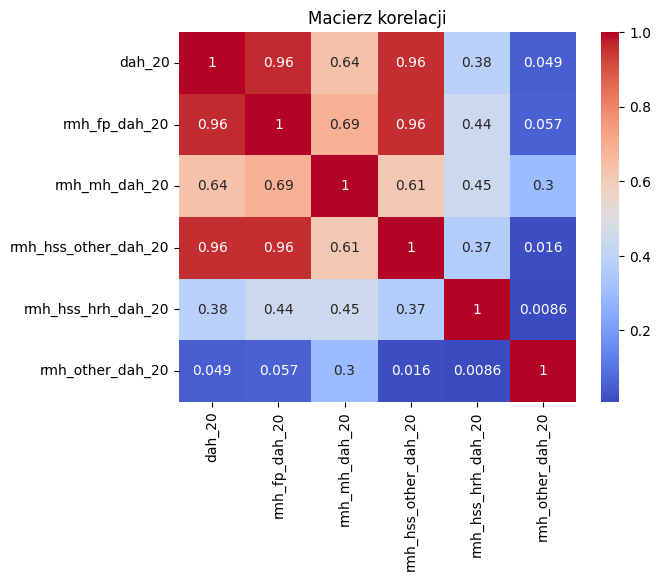

In [19]:
import numpy as np

# Macierz korelacji
correlation_matrix = df[cols_to_convert[0:6]].corr()

# Heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Macierz korelacji')
plt.show()